# Datathon 6

In [3]:
# Importing the required libraries
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
from keras.utils.np_utils import to_categorical, normalize
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from keras import regularizers
from keras import optimizers
from keras import backend as K
from keras.optimizers import SGD, RMSprop, Adam, Nadam
from keras.utils import np_utils
from keras.layers import Conv2D, MaxPooling2D, Activation, MaxPool2D, Convolution2D
from keras.layers import Input, Dense, Dropout, Flatten, BatchNormalization, TimeDistributed, LSTM
from keras.models import Model, load_model, Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau, LearningRateScheduler, ModelCheckpoint, Callback
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import glob
import matplotlib
import keras
import random
import datetime
import os
import warnings
warnings.filterwarnings("ignore")
####################################################################################
####################################################################################
####################################################################################
%load_ext tensorboard
%matplotlib inline

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [4]:
print('Numpy:', np.__version__, '\nPandas:', pd.__version__, '\nTensorFlow:', tf.__version__,
      '\nOpenCV:', cv2.__version__, '\nMatplotlib', matplotlib.__version__, '\nKeras:', keras.__version__)

Numpy: 1.18.5 
Pandas: 1.0.5 
TensorFlow: 2.3.0 
OpenCV: 4.4.0 
Matplotlib 3.2.2 
Keras: 2.4.3


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


 **Dataset Link:<br>
 https://drive.google.com/file/d/1_W2gFFZmy6ZyC8TPlxB49eDFswdBsQqo/view?usp=sharing**

In [ ]:
!unzip - q "/content/drive/My Drive/face_mask_detection.zip"

In [ ]:
train_df = pd.read_csv('face_mask_detection/Training_set_face_mask.csv')

## Preprocessing
* Adding Border (make Height=Weight)
* Resizing Image

In [ ]:
def resizing(n, size=(105, 105)):
    # print(n.shape)
    max_shape = (max(n.shape))
    delta_w = max_shape - n.shape[1]
    delta_h = max_shape - n.shape[0]
    top, bottom = delta_h//2, delta_h-(delta_h//2)
    left, right = delta_w//2, delta_w-(delta_w//2)
    temp = cv2.copyMakeBorder(n, top, bottom, left, right,
                              cv2.BORDER_REPLICATE)
    temp = cv2.resize(temp, size)
    return temp

## Import the Images

In [ ]:
train_file = pd.read_csv('face_mask_detection/Training_set_face_mask.csv')
train_img = []
for i in train_file['filename']:
    n = cv2.imread('face_mask_detection/train/'+i)
    temp = resizing(n)
    train_img.append(temp)

In [ ]:
y = train_df['label']

## Show random sets of images with their associated labels.

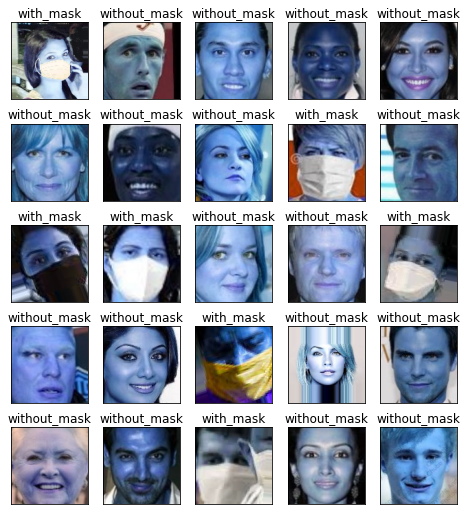

In [ ]:
plt.figure(figsize=(8, 9))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    rand_no = random.randint(0, len(train_img))
    plt.title(y[rand_no])
    plt.imshow(train_img[rand_no])

In [ ]:
X = np.array(train_img)
X.shape

(11264, 112, 112, 3)

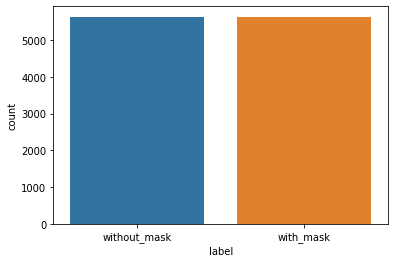

In [ ]:
sns.countplot(y)

In [ ]:
X = X/255.0

In [ ]:
# Import Label Encoder for encoding the Labels with numbers
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [ ]:
y_mod = le.fit_transform(y)
Y = to_categorical(y_mod, 2)

In [ ]:
# Split images into train ans test set
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=2, shuffle=True)

In [ ]:
datagen = ImageDataGenerator(
    zoom_range=0.1,
    featurewise_center=False,  # set input mean to 0 over the dataset
    samplewise_center=False,  # set each sample mean to 0
    featurewise_std_normalization=False,  # divide inputs by std of the dataset
    samplewise_std_normalization=False,  # divide each input by its std
    zca_whitening=False,  # apply ZCA whitening
    # randomly rotate images in the range (degrees, 0 to 180)
    rotation_range=10,
    # randomly shift images horizontally (fraction of total width)
    width_shift_range=0.1,
    # randomly shift images vertically (fraction of total height)
    height_shift_range=0.1,
    horizontal_flip=True,  # randomly flip images
    vertical_flip=False)  # randomly flip images
datagen.fit(X_train)

In [ ]:
# Creating a Sequential Model and adding the layers
model = Sequential()
weight_decay = 0.0005

model.add(Conv2D(64, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay), input_shape=X_train.shape[1:],))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))
#############################################################################
model.add(Conv2D(64, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
#############################################################################
model.add(Conv2D(128, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(256, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
#############################################################################
model.add(Conv2D(256, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
#############################################################################
model.add(Conv2D(256, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
#############################################################################
model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
#############################################################################
model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
#############################################################################
model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
#############################################################################
model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))
#############################################################################
model.add(Flatten())
model.add(Dense(512, kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))
#############################################################################
learning_rate = 0.1
lr_decay = 1e-6
lr_drop = 20
#############################################################################
sgd = optimizers.SGD(lr=learning_rate, decay=lr_decay,
                     momentum=0.9, nesterov=True)
#model.compile(loss='categorical_crossentropy', optimizer=optimizers.Adam(amsgrad=True,lr=0.0015), metrics=['accuracy'])
model.compile(loss='categorical_crossentropy',
              optimizer=sgd, metrics=['accuracy'])

In [ ]:
def lr_scheduler(epoch):
    return learning_rate * (0.5 ** (epoch // lr_drop))
reduce_lr = keras.callbacks.LearningRateScheduler(lr_scheduler)

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

filepath = "basic.hdf5"
checkpoint = ModelCheckpoint(
    filepath, monitor='val_loss', verbose=1, mode='auto', save_best_only=True)

#logdir = os.path.join("logs4_load2", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir, histogram_freq=1)

In [ ]:
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4,
                                               restore_best_weights=True,
                                               verbose=1)

In [ ]:
history = model.fit(datagen.flow(X_train, y_train, batch_size=32),
                    steps_per_epoch=X_train.shape[0] // 32,
                    validation_data=(X_test, y_test),
                    epochs=100,
                    callbacks=[reduce_lr, tensorboard_callback,
                               checkpoint, es_callback],
                    verbose=1)

Epoch 1/100
  1/281 [..............................] - ETA: 0s - loss: 3.7344 - accuracy: 0.5312WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
281/281 [==============================] - ETA: 0s - loss: 102.2434 - accuracy: 0.7944
Epoch 00001: val_loss improved from inf to 81.07803, saving model to basic.hdf5
281/281 [==============================] - 33s 119ms/step - loss: 102.2434 - accuracy: 0.7944 - val_loss: 81.0780 - val_accuracy: 0.8566
Epoch 2/100
281/281 [==============================] - ETA: 0s - loss: 61.9847 - accuracy: 0.8866
Epoch 00002: val_loss improved from 81.07803 to 46.07879, saving model to basic.hdf5
281/281 [==============================] - 32s 114ms/step - loss: 61.9847 - accuracy: 0.8866 - val_loss: 46.0788 - val_accuracy: 0.8784
Epo

## Plot Model Accuracy and Loss graphs

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


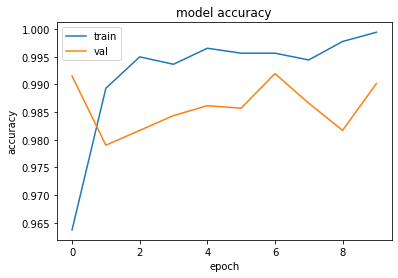

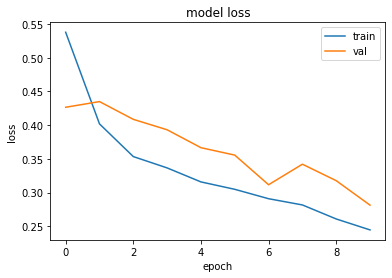

In [ ]:
print(history.history.keys())
#  Ploting the accuracy graph
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()
# Ploting the loss graph
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='best')
plt.show()

In [ ]:
model1 = load_model('basic.hdf5')

## Load the test file

In [ ]:
test_file = pd.read_csv('face_mask_detection/Testing_set_face_mask.csv')
test_img = []
for i in test_file['filename']:
    n = cv2.imread('face_mask_detection/test/'+i)
    # print(i)
    temp = resizing(n)
    test_img.append(temp)

In [ ]:
test = np.array(test_img)/255.0

In [ ]:
result = pd.DataFrame(le.inverse_transform(
    np.argmax(model.predict(test), axis=1)))

NameError: ignored

868
743
418
556
1117
675
954
815
1526
1483
1443
1096
1491
856
840
23
128
902
388
306
1495
907
1438
657
1245
1198
1110
1000
128
72
1358
133
1206
1276
293
708
1195
919
216
66
709
185
102
149
243
602
1047
202
1001
1390


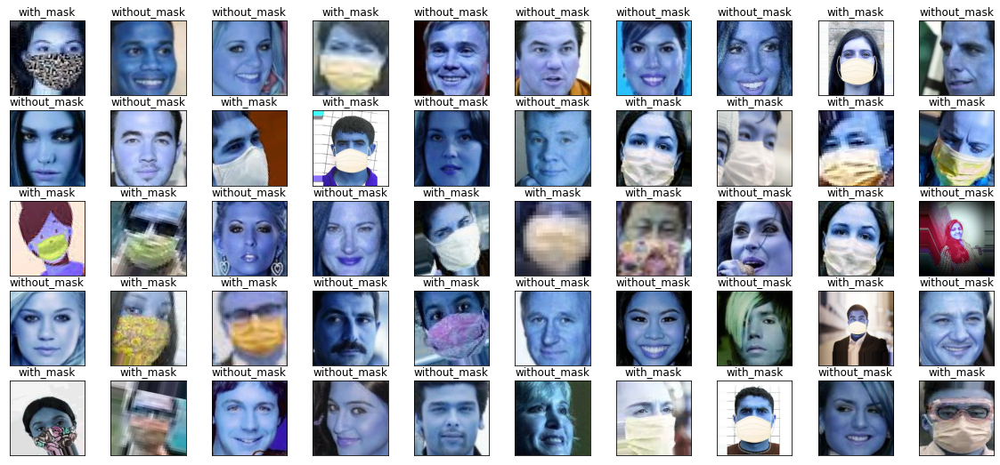

In [ ]:
plt.figure(figsize=(20, 9))
for i in range(50):
    plt.subplot(5, 10, i+1)
    plt.xticks([])
    plt.yticks([])
    rand_no = random.randint(0, len(test))
    plt.title(results.loc[rand_no][1])
    plt.imshow(test[rand_no])
    print(rand_no)

In [ ]:
result.to_csv('prediction.csv')

In [ ]:
%tensorboard - -logdir logs/fit

<IPython.core.display.Javascript object>

# Transfer Learning

In [ ]:
datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    zoom_range=0.1,
    featurewise_center=False,  # set input mean to 0 over the dataset
    samplewise_center=False,  # set each sample mean to 0
    featurewise_std_normalization=False,  # divide inputs by std of the dataset
    samplewise_std_normalization=False,  # divide each input by its std
    zca_whitening=False,  # apply ZCA whitening
    # randomly rotate images in the range (degrees, 0 to 180)
    rotation_range=10,
    # randomly shift images horizontally (fraction of total width)
    width_shift_range=0.1,
    # randomly shift images vertically (fraction of total height)
    height_shift_range=0.1,
    horizontal_flip=True,  # randomly flip images
    vertical_flip=False,
    validation_split=0.2)  # randomly flip images
# (std, mean, and principal components if ZCA whitening is applied).

In [ ]:
train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    directory="face_mask_detection/train",
    x_col="filename",
    y_col="label",
    subset="training",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(298, 298))

valid_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    directory="face_mask_detection/train",
    x_col="filename",
    y_col="label",
    subset="validation",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(298, 298))

Found 9012 validated image filenames belonging to 2 classes.
Found 2252 validated image filenames belonging to 2 classes.


## VGG19

In [ ]:
# define input shape
INPUT_SHAPE = (224, 224, 3)

# get the VGG19 model
vgg_layers = tf.keras.applications.vgg19.VGG19(weights='imagenet', include_top=False,
                                               input_shape=INPUT_SHAPE)

vgg_layers.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
# Fine-tune all the layers
for layer in vgg_layers.layers:
    layer.trainable = True

In [ ]:
model = tf.keras.models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_layers)
weight_decay = 0.0005
model.add(Flatten())
model.add(Dense(512, kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))

# compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# view model layers
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 7, 7, 512)         20024384  
_________________________________________________________________
flatten_2 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               12845568  
_________________________________________________________________
activation_2 (Activation)    (None, 512)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                

In [ ]:
EPOCHS = 100
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3,
                                               restore_best_weights=True,
                                               verbose=1)

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
history = model.fit_generator(generator=train_generator,
                              steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator,
                              callbacks=[es_callback],
                              validation_steps=STEP_SIZE_VALID,
                              epochs=10)

Epoch 1/10
281/281 [==============================] - 146s 521ms/step - loss: 0.5379 - accuracy: 0.9637 - val_loss: 0.4266 - val_accuracy: 0.9915
Epoch 2/10
281/281 [==============================] - 145s 517ms/step - loss: 0.4019 - accuracy: 0.9893 - val_loss: 0.4350 - val_accuracy: 0.9790
Epoch 3/10
281/281 [==============================] - 145s 516ms/step - loss: 0.3534 - accuracy: 0.9950 - val_loss: 0.4087 - val_accuracy: 0.9817
Epoch 4/10
281/281 [==============================] - 146s 518ms/step - loss: 0.3366 - accuracy: 0.9937 - val_loss: 0.3932 - val_accuracy: 0.9844
Epoch 5/10
281/281 [==============================] - 145s 517ms/step - loss: 0.3159 - accuracy: 0.9965 - val_loss: 0.3666 - val_accuracy: 0.9862
Epoch 6/10
281/281 [==============================] - 146s 519ms/step - loss: 0.3049 - accuracy: 0.9957 - val_loss: 0.3556 - val_accuracy: 0.9857
Epoch 7/10
281/281 [==============================] - 146s 518ms/step - loss: 0.2910 - accuracy: 0.9957 - val_loss: 0.3117 -

## InceptionResnetV2

In [ ]:
# define input shape
INPUT_SHAPE = (298, 298, 3)

# get the Resnet model
resnet_layers = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False,
                                                        input_shape=INPUT_SHAPE)

resnet_layers.summary()

219062272/219055592 [==============================] - 5s 0us/step
Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 298, 298, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 148, 148, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_2 (BatchNor (None, 148, 148, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation_4 (Activation)       (None, 148, 148, 32) 0           batch_normalization_2[0][0]      
_____________

In [ ]:
# Fine-tune all the layers
for layer in resnet_layers.layers:
    layer.trainable = True


# define sequential model
model = tf.keras.models.Sequential()
weight_decay = 0.0005
# Add the vgg convolutional base model
model.add(resnet_layers)

model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Conv2D(512, (3, 3), padding='same',
                 kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(512, kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# view model layers
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Functio (None, 7, 7, 1536)        54336736  
_________________________________________________________________
conv2d_203 (Conv2D)          (None, 7, 7, 512)         7078400   
_________________________________________________________________
activation_207 (Activation)  (None, 7, 7, 512)         0         
_________________________________________________________________
batch_normalization_205 (Bat (None, 7, 7, 512)         2048      
_________________________________________________________________
dropout_2 (Dropout)          (None, 7, 7, 512)         0         
_________________________________________________________________
conv2d_204 (Conv2D)          (None, 7, 7, 512)         2359808   
_________________________________________________________________
activation_208 (Activation)  (None, 7, 7, 512)        

In [ ]:
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4,
                                               restore_best_weights=True,
                                               verbose=1)

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
history = model.fit_generator(generator=train_generator,
                              steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator,
                              callbacks=[es_callback],
                              validation_steps=STEP_SIZE_VALID,
                              epochs=1)

281/281 [==============================] - 261s 927ms/step - loss: 1.0670 - accuracy: 0.9994 - val_loss: 1.0714 - val_accuracy: 0.9964


## Load test images

In [ ]:
test_file = pd.read_csv('face_mask_detection/Testing_set_face_mask.csv')
test_file.head()

,filename,label
0,Image_1.jpg,NaN
1,Image_2.jpg,NaN
2,Image_3.jpg,NaN
3,Image_4.jpg,NaN
4,Image_5.jpg,NaN


In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255.)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_file,
    directory="face_mask_detection/test",
    x_col="filename",
    y_col=None,
    batch_size=32,
    seed=42,
    shuffle=False,
    class_mode=None,
    target_size=(298, 298))

Found 1536 validated image filenames.


In [ ]:
STEP_SIZE_TEST = test_generator.n//test_generator.batch_size
model.evaluate_generator(generator=valid_generator,
                         steps=STEP_SIZE_TEST)

[1.0688751935958862, 0.9973958134651184]

In [ ]:
test_generator.reset()

pred = model.predict_generator(test_generator,
                               steps=STEP_SIZE_TEST,
                               verbose=1)

48/48 [==============================] - 9s 194ms/step


In [ ]:
predicted_class_indices = np.argmax(pred, axis=1)

In [ ]:
predicted_class_indices

array([1, 0, 1, ..., 0, 0, 1])

In [ ]:
labels = (train_generator.class_indices)
labels = dict((v, k) for k, v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]

In [ ]:
filenames = test_generator.filenames
results = pd.DataFrame({"Filename": filenames,
                        "Predictions": predictions})
results.to_csv("results.csv", index=False)

**References: https://medium.com/@vijayabhaskar96/tutorial-on-keras-flow-from-dataframe-1fd4493d237c**